# Drive

In [2]:
from google.colab import drive
drive.mount('/content/gdrive/')
root_dir = "/content/gdrive/My Drive/"

Drive already mounted at /content/gdrive/; to attempt to forcibly remount, call drive.mount("/content/gdrive/", force_remount=True).


# Libs

In [3]:
!pip install deep-translator

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.3/42.3 kB 1.4 MB/s eta 0:00:00


In [4]:
!pip install salesforce-lavis

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 29.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.6/13.6 MB 63.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.2/42.2 kB 4.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 235.4/235.4 kB 32.9 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Installing backend dependencies ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.1/53.1 kB 7.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.2/42.2 kB 5.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.5/79.5 kB 5.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 47.8/47.8 MB 11.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 203.7/203.7 kB 22.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━

In [5]:
import pandas as pd
import numpy as np
from PIL import Image
import requests
from tqdm import tqdm
import torch
import torch.nn.functional as F
from pkg_resources import packaging
from glob import glob
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
import seaborn as sns
sns.set_theme("notebook", font_scale=1.3)
import os
import json
from deep_translator import GoogleTranslator
from scipy import spatial

from torchvision import transforms
from torchvision.transforms.functional import InterpolationMode
import numpy as np, matplotlib, matplotlib.pyplot as plt, seaborn as sns

# Unzip folder

In [6]:
!unzip /content/pietanze.zip

Archive:  /content/pietanze.zip
   creating: pietanze/
  inflating: pietanze/mappa.json     
  inflating: pietanze/.DS_Store      
   creating: pietanze/dolce/
  inflating: pietanze/dolce/bigne_1.jpg  
  inflating: pietanze/dolce/.DS_Store  
  inflating: pietanze/dolce/tiramisu_2.jpeg  
  inflating: pietanze/dolce/bigne_2.jpg  
  inflating: pietanze/dolce/bigne_3.jpg  
  inflating: pietanze/dolce/baba_1.jpeg  
  inflating: pietanze/dolce/crostata_1.jpg  
  inflating: pietanze/dolce/crostata_3.jpg  
  inflating: pietanze/dolce/crostata_2.jpg  
  inflating: pietanze/dolce/baba_2.jpg  
  inflating: pietanze/dolce/baba_3.jpg  
  inflating: pietanze/dolce/panna_cotta_1.jpeg  
  inflating: pietanze/dolce/panna_cotta_2.jpg  
  inflating: pietanze/dolce/panna_cotta_3.jpg  
  inflating: pietanze/dolce/tiramisu_1.jpg  
  inflating: pietanze/dolce/tiramisu_3.jpg  
  inflating: pietanze/dolce/millefoglie_1.jpg  
  inflating: pietanze/dolce/millefoglie_2.jpg  
  inflating: pietanze/dolce/millefogli

In [7]:
import json
image_map = None
with open('/content/pietanze/mappa.json', 'r') as f:
    image_map = json.load(f)

# Functions

In [8]:
# setting device on GPU if available, else CPU
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print('Using device:', device)
print()

#Additional Info when using cuda
if device.type == 'cuda':
    print(torch.cuda.get_device_name(0))

Using device: cuda

Tesla T4


In [9]:
def translate_caption(string):
    try:
        #print('ita_string: ', string)
        string_translated = GoogleTranslator(source='auto', target='en').translate(string)
        #print('string_translated: ', string_translated)
        return string_translated
    except Exception as e:
        string_translated = ''
        print("Errore per ita_string '{}' - caption '{}' - errore: {}".format(string))
        return string_translated

In [10]:
def transform_image(image, image_size):

    transform = transforms.Compose([
        transforms.Resize((image_size,image_size),interpolation=InterpolationMode.BICUBIC),
        transforms.ToTensor(),
        transforms.Normalize((0.48145466, 0.4578275, 0.40821073), (0.26862954, 0.26130258, 0.27577711))
        ])
    image = transform(image)
    return image

# Load images and texts

Read the map with the path to the images and their corresponding descriptions. Put the images and the descriptions in the lists "images" and "texts". Show images, description and name in a figure

In [11]:
principal_dir = "/content/pietanze"

images = []
texts = []
names_image = []
original_texts = []
#plt.figure(figsize=(300, 300)) # Width, height

# iter over the dishes
for _, dishes, _ in os.walk(principal_dir):
    for dish in dishes:
        path_dish = os.path.join(principal_dir, dish)
        CHECK_FOLDER = os.path.isdir(path_dish)
        if CHECK_FOLDER:
            print("DISH: ", dish)
            print("PATH DISH: ", path_dish)

            images_list = os.listdir(path_dish)
            print("images_list: ", images_list)
            for name_image in images_list:
                if name_image != ".DS_Store" and name_image != ".ipynb_checkpoints":
                    path_image = os.path.join(path_dish, name_image)
                    chiave = ("/").join(path_image.split("/")[2:])
                    image = Image.open(path_image).convert("RGB")
                    origninal_text = image_map[chiave]
                    text = translate_caption(origninal_text)

                    #plt.subplot(len(image_map), 1, len(images) + 1)
                    #plt.imshow(image)
                    #plt.title(f"{name_image}\n{text}")
                    #plt.xticks([])
                    #plt.yticks([])

                    images.append(image)
                    texts.append(text)
                    names_image.append(name_image)
                    original_texts.append(origninal_text)

            print("----------------------------------")

#plt.savefig("/content/gdrive/MyDrive/Colab Notebooks/LAVIS/search_pietanze/list_images_descriptions.png")
#plt.tight_layout()

DISH:  dolce
PATH DISH:  /content/pietanze/dolce
images_list:  ['panna_cotta_1.jpeg', 'baba_3.jpg', 'panna_cotta_2.jpg', 'crostata_2.jpg', 'tiramisu_2.jpeg', 'bigne_1.jpg', 'tiramisu_1.jpg', 'bigne_3.jpg', 'crostata_3.jpg', 'bigne_2.jpg', 'millefoglie_3.jpg', 'panna_cotta_3.jpg', 'millefoglie_2.jpg', 'crostata_1.jpg', 'baba_1.jpeg', '.DS_Store', 'tiramisu_3.jpg', 'millefoglie_1.jpg', 'baba_2.jpg']
----------------------------------
DISH:  pizza
PATH DISH:  /content/pietanze/pizza
images_list:  ['pizza_marinara_2.jpg', 'pizza_marinara_3.jpg', 'pizza_capricciosa_2.jpg', 'pizza_margherita_2.jpg', 'pizza_capricciosa_1.jpg', 'calzone_2.jpg', 'pizza_napoli_2.jpg', 'pizza_quattro_formaggi_2.jpg', 'pizza_margherita_3.jpg', 'pizza_quattro_formaggi_1.jpg', 'pizza_quattro_stagioni.jpg', 'pizza_marinara_1.jpg', 'pizza_margherita_1.jpg', '.DS_Store', 'pizza_napoli.jpg', 'pizza_quattro_stagioni_2.jpg', 'calzone.jpg', 'pizza_quattro_stagioni_3.jpg']
----------------------------------
DISH:  carne
PAT

# Apply BLIP2 from LAVIS lib - images, text and multimodal embedding

name="blip2_feature_extractor", model_type="coco"

In [12]:
from lavis.models import load_model_and_preprocess
model, vis_processors, txt_processors = load_model_and_preprocess(name="blip2_feature_extractor", model_type="coco", is_eval=True, device=device)

100%|██████████| 1.89G/1.89G [01:31<00:00, 22.1MB/s]


Position interpolate from 16x16 to 26x26


100%|██████████| 4.37G/4.37G [04:15<00:00, 18.3MB/s]


## Extraction of the embeddings

In [13]:
images_embedding = None
texts_embedding = None
multimodal_embedding = None

# iter over the list of text and images

for text, image in zip(texts,images):
    image_processed = vis_processors["eval"](image).unsqueeze(0).to(device)
    text_translated = translate_caption(text)
    text_input = txt_processors["eval"](text_translated)
    sample = {"image": image_processed, "text_input": [text_input]}

    multimodal_emb = model.extract_features(sample).multimodal_embeds[:,0,:] # size (1, 768)
    image_emb = model.extract_features(sample, mode="image").image_embeds[:,0,:] # size (1, 768)
    text_emb = model.extract_features(sample, mode="text").text_embeds[:,0,:] # size (1, 768)

    # stack tensor
    if images_embedding is None:
        images_embedding = image_emb
    else:
       images_embedding = torch.cat((images_embedding, image_emb),0)

    if texts_embedding is None:
        texts_embedding = text_emb
    else:
       texts_embedding = torch.cat((texts_embedding, text_emb),0)

    if multimodal_embedding is None:
        multimodal_embedding = multimodal_emb
    else:
       multimodal_embedding = torch.cat((multimodal_embedding, multimodal_emb),0)

print('images_embedding.size(): ', images_embedding.size())
print('texts_embedding.size(): ', texts_embedding.size())
print('multimodal_embedding.size(): ', multimodal_embedding.size())
'''
images_embedding.size():  torch.Size([69, 768])
texts_embedding.size():  torch.Size([69, 768])
multimodal_embedding.size():  torch.Size([69, 768])
'''

/usr/local/lib/python3.10/dist-packages/torch/utils/checkpoint.py:31: UserWarning: None of the inputs have requires_grad=True. Gradients will be None
  warnings.warn("None of the inputs have requires_grad=True. Gradients will be None")


images_embedding.size():  torch.Size([68, 768])
texts_embedding.size():  torch.Size([68, 768])
multimodal_embedding.size():  torch.Size([68, 768])


'\nimages_embedding.size():  torch.Size([69, 768])\ntexts_embedding.size():  torch.Size([69, 768])\nmultimodal_embedding.size():  torch.Size([69, 768])\n'

## Normalization

Divide each tensors by its norm. In this way when i calculate the dot product between two tensors i directly obtain the cosin between the two

In [14]:
images_embedding /= images_embedding.norm(dim=-1, keepdim=True)
texts_embedding /= texts_embedding.norm(dim=-1, keepdim=True)
multimodal_embedding /= multimodal_embedding.norm(dim=-1, keepdim=True)

## Similarity matrices

In [15]:
## image vs image
similarity_images = images_embedding.cpu().detach().numpy() @ images_embedding.cpu().detach().numpy().T
similarity_images_texts = images_embedding.cpu().detach().numpy() @ texts_embedding.cpu().detach().numpy().T
similarity_multimodal = multimodal_embedding.cpu().detach().numpy() @ multimodal_embedding.cpu().detach().numpy().T
similarity_images_multimodal = images_embedding.cpu().detach().numpy() @ multimodal_embedding.cpu().detach().numpy().T

function to plot the similarity matrixfor the plot i use
https://stackoverflow.com/questions/67310634/how-to-plot-image-image-similarity-matrix-map

In [16]:
def ImgLabels(N, ax):

    def offset_image(coord, image_plot, ax):

        im = matplotlib.offsetbox.OffsetImage(image_plot, zoom = 1)
        im.image.axes = ax

        for co, xyb in [((0, coord), (-30, -30)),    ((coord, N), (+30, -30))]: # these number have to be adjusted if change the image dimension as well as the number of examples
            ab = matplotlib.offsetbox.AnnotationBbox(im, co,  xybox = xyb,
                frameon=False, xycoords='data',  boxcoords="offset points", pad=0)
            ax.add_artist(ab)

    for i, img in enumerate(images):
        image_resized = img.resize((55, 55))
        offset_image(i, image_resized, ax)

def HeatMap(N, corr):
    sns.set_theme(style = "white")
    mask = np.triu(np.ones_like(corr, dtype = bool))
    cmap = sns.diverging_palette(230, 20, as_cmap=True)
    sns.heatmap(corr, mask=mask, cmap=cmap, vmin=-1, vmax=1, center=0,
                square=True, annot = True, xticklabels = False, yticklabels = False)


def plot_similarity_matrix(matrix, dimension, name_fig):
    f, ax = plt.subplots(figsize=(100, 100))
    HeatMap(dimension, matrix)
    ImgLabels(dimension, ax)
    plt.savefig("/content/gdrive/MyDrive/Colab Notebooks/LAVIS/search_pietanze/similarity_matrices/"+name_fig+".png")
    plt.show()

### Image-image similarity

In [17]:
name_fig = "images_blip2_coco"
plot_similarity_matrix(similarity_images, 68, name_fig)

### Image-text similarity

In [ ]:
name_fig = "images_texts_blip2_coco"
plot_similarity_matrix(similarity_images_texts, 68, name_fig)

### Multimodal-multimodal similarity

In [ ]:
name_fig = "multimodal_blip2_coco"
plot_similarity_matrix(similarity_multimodal, 68, name_fig)

### Images-multimodal similarity

In [ ]:
name_fig = "images_multimodal_blip2_coco"
plot_similarity_matrix(similarity_images_multimodal, 68, name_fig)

## Search function

search_modality: (II for image vs image - TI for text vs image - MI for multimodal vs image -  IT for image vs text - TT for text vs text - MT for multimodal vs text - IM for image vs multimodal - TM for text vs multimodal - MM for multimodal vs multimodal). The first argument refers to the target product the second for the database product

In [ ]:
def search_similar_product(image_target, text_target, number_retrieval, search_modality, len_dataset = 68, is_coco_finetuned = False):

    retrieval_map = {}

    # preprocess image. check if the image is None. In this case build a tensor with shape (1, 3, 224, 224)
    if image_target is None:
        if is_coco_finetuned:
            image_processed = torch.rand(1, 3, 364, 364).to(device)
        else:
            image_processed = torch.rand(1, 3, 224, 224).to(device)
    else:
      image_processed = vis_processors["eval"](image_target).unsqueeze(0).to(device)

    # preprocess text
    text_translated = translate_caption(text_target)
    text_input = txt_processors["eval"](text_translated)

    # build sample
    sample = {"image": image_processed, "text_input": [text_input]}

    # find features of image and text target
    multimodal_emb = model.extract_features(sample).multimodal_embeds[0,0,:] # size (768)
    image_emb = model.extract_features(sample, mode="image").image_embeds[0,0,:] # size (768)
    text_emb = model.extract_features(sample, mode="text").text_embeds[0,0,:] # size (768)

    # normalize
    image_emb /= image_emb.norm(dim=-1, keepdim=True)
    text_emb /= text_emb.norm(dim=-1, keepdim=True)
    multimodal_emb /= multimodal_emb.norm(dim=-1, keepdim=True)

    # transform to numpy tensor
    image_emb = image_emb.cpu().detach().numpy()
    text_emb = text_emb.cpu().detach().numpy()
    multimodal_emb = multimodal_emb.cpu().detach().numpy()

    if search_modality == "II":
      similarity_vector = images_embedding.cpu().detach().numpy() @ image_emb.T
    elif search_modality == "TI":
      similarity_vector = images_embedding.cpu().detach().numpy() @ text_emb.T
    elif search_modality == "MI":
      similarity_vector = images_embedding.cpu().detach().numpy() @ multimodal_emb.T

    elif search_modality == "IT":
      similarity_vector = texts_embedding.cpu().detach().numpy() @ image_emb.T
    elif search_modality == "TT":
      similarity_vector = texts_embedding.cpu().detach().numpy() @ text_emb.T
    elif search_modality == "MT":
      similarity_vector = texts_embedding.cpu().detach().numpy() @ multimodal_emb.T

    elif search_modality == "IM":
      similarity_vector = multimodal_embedding.cpu().detach().numpy() @ image_emb.T
    elif search_modality == "TM":
      similarity_vector = multimodal_embedding.cpu().detach().numpy() @ text_emb.T
    elif search_modality == "MM":
      similarity_vector = multimodal_embedding.cpu().detach().numpy() @ multimodal_emb.T

    index_sorted = np.argsort(similarity_vector)

    for i in range(1, number_retrieval+1):

        print("Extracted: ", i)

        # index of the db product
        idx = index_sorted[len_dataset-i]
        similarity_value = similarity_vector[idx]

        print("idx: ", idx)
        print("similarity value: ", similarity_value)

        # extract name of the image
        name_image_found = names_image[idx]
        print("name_image_found: ", name_image_found)
        print("-----------------------")

        # extract text of the image
        text_image_found = original_texts[idx]
        translated_text_image_found = texts[idx]

        # extract image
        image_found = images[idx]

        #fill the extracted infos in the map
        retrieval_map[i] = (image_found, name_image_found, text_image_found, translated_text_image_found, similarity_value)

    return retrieval_map

### Test 1

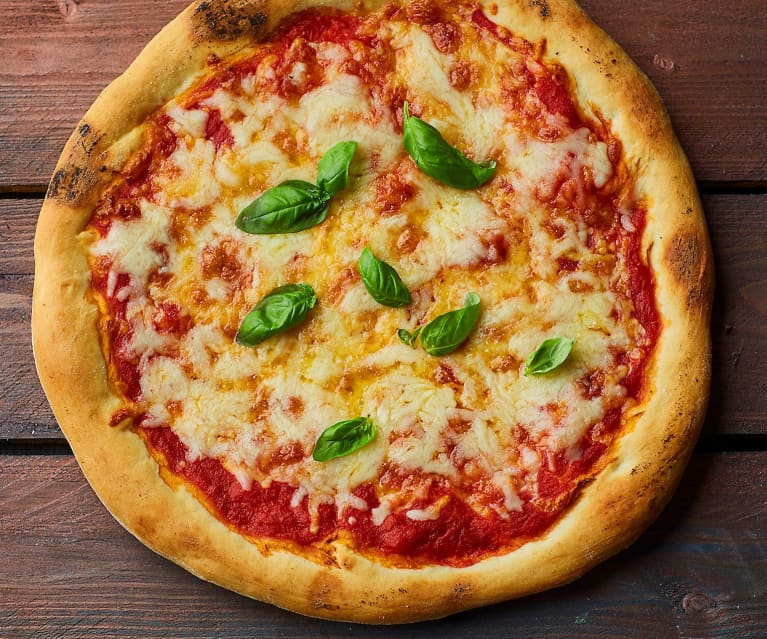

In [ ]:
path_image_target = "/content/gdrive/MyDrive/Colab Notebooks/LAVIS/search_pietanze/test_images/pizza_marghetita_test.jpg"
text_image_target = ""
number_retrieval = 3
raw_image = Image.open(path_image_target).convert("RGB")
display(raw_image)

Extracted:  1
idx:  21
similarity value:  0.91049397
name_image_found:  pizza_margherita_2.jpg
-----------------------
Extracted:  2
idx:  30
similarity value:  0.89521444
name_image_found:  pizza_margherita_1.jpg
-----------------------
Extracted:  3
idx:  25
similarity value:  0.79740316
name_image_found:  pizza_quattro_formaggi_2.jpg
-----------------------


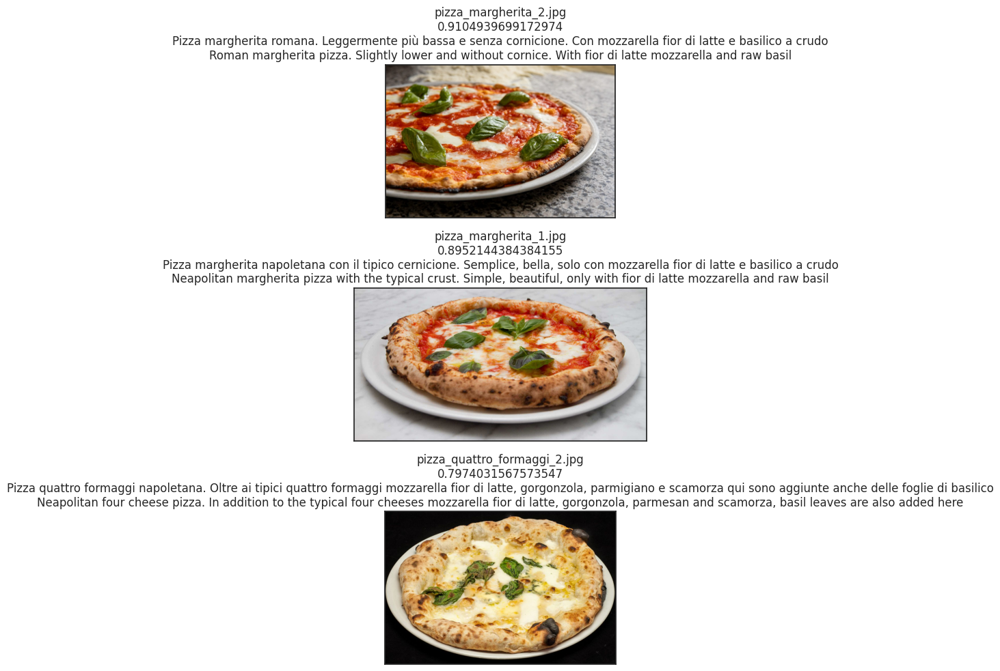

In [ ]:
retrieval_map = search_similar_product(image_target=raw_image,
                                       text_target=text_image_target,
                                       number_retrieval=number_retrieval,
                                       search_modality="II")


plt.figure(figsize=(10, 10))
for i in range(1, len(retrieval_map)+1):

    image, name_image, text, translated_text, similarity_value = retrieval_map[i]
    plt.subplot(number_retrieval, 1, i)
    plt.imshow(image)
    plt.title(f"{name_image}\n{similarity_value}\n{text}\n{translated_text}")
    plt.xticks([])
    plt.yticks([])

plt.tight_layout()

### Test 2

In [ ]:
path_image_target = "/content/gdrive/MyDrive/Colab Notebooks/LAVIS/search_pietanze/test_images/bistecca_fiorentina_test.jpg"
text_image_target = ""
number_retrieval = 5
raw_image = Image.open(path_image_target).convert("RGB")
display(raw_image)

Extracted:  1
idx:  48
similarity value:  0.8790977
name_image_found:  bistecca_fiorentina_3.jpg
-----------------------
Extracted:  2
idx:  47
similarity value:  0.5841371
name_image_found:  filetto_manzo_1.jpg
-----------------------
Extracted:  3
idx:  43
similarity value:  0.56042194
name_image_found:  bistecca_fiorentina_2.jpg
-----------------------
Extracted:  4
idx:  36
similarity value:  0.5047699
name_image_found:  filetto_pepe_verde.jpg
-----------------------
Extracted:  5
idx:  53
similarity value:  0.50344765
name_image_found:  bistecca_fiorentina_1.jpg
-----------------------


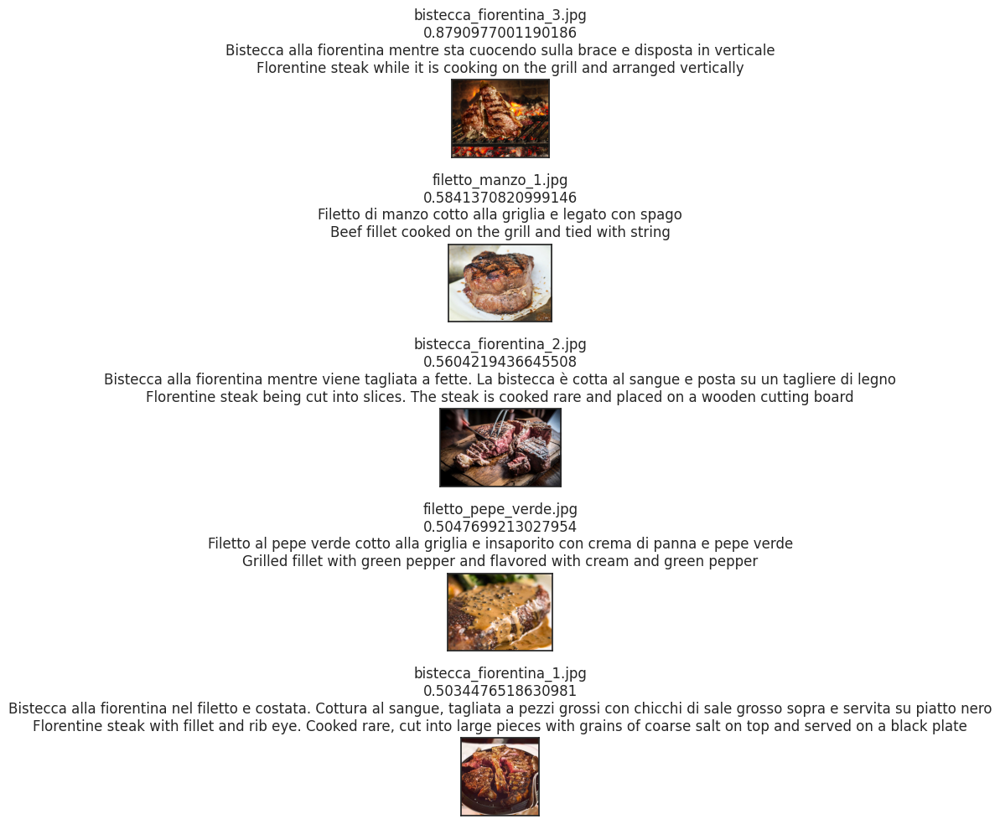

In [ ]:
retrieval_map = search_similar_product(image_target=raw_image,
                                       text_target=text_image_target,
                                       number_retrieval=number_retrieval,
                                       search_modality="II")


plt.figure(figsize=(10, 10))
for i in range(1, len(retrieval_map)+1):

    image, name_image, text, translated_text, similarity_value = retrieval_map[i]
    plt.subplot(number_retrieval, 1, i)
    plt.imshow(image)
    plt.title(f"{name_image}\n{similarity_value}\n{text}\n{translated_text}")
    plt.xticks([])
    plt.yticks([])

plt.tight_layout()

### Test 3


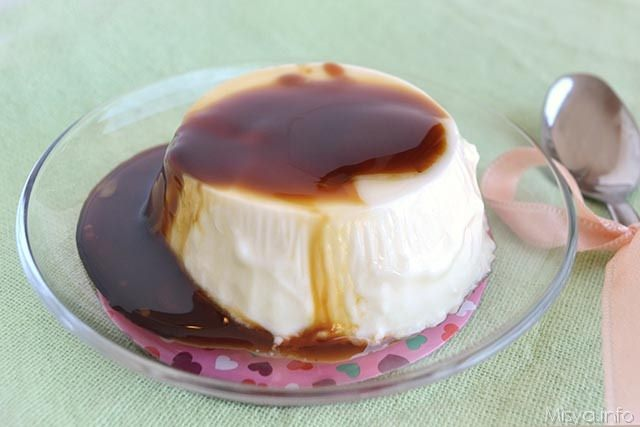

In [ ]:
path_image_target = "/content/gdrive/MyDrive/Colab Notebooks/LAVIS/search_pietanze/test_images/panna_cotta_caramello_test.jpg"
text_image_target = ""
number_retrieval = 5
raw_image = Image.open(path_image_target).convert("RGB")
display(raw_image)

Extracted:  1
idx:  2
similarity value:  0.9267527
name_image_found:  panna_cotta_2.jpg
-----------------------
Extracted:  2
idx:  11
similarity value:  0.8096936
name_image_found:  panna_cotta_3.jpg
-----------------------
Extracted:  3
idx:  0
similarity value:  0.78129816
name_image_found:  panna_cotta_1.jpeg
-----------------------
Extracted:  4
idx:  15
similarity value:  0.6462978
name_image_found:  tiramisu_3.jpg
-----------------------
Extracted:  5
idx:  46
similarity value:  0.597034
name_image_found:  vitello_tonnato_2.jpg
-----------------------


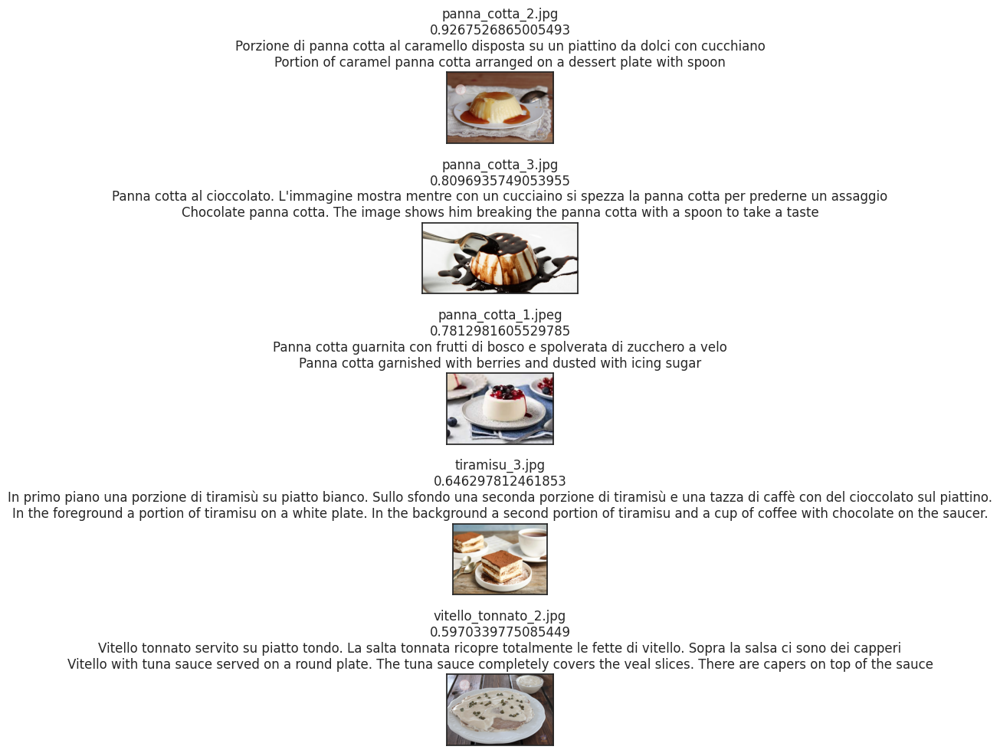

In [ ]:
retrieval_map = search_similar_product(image_target=raw_image,
                                       text_target=text_image_target,
                                       number_retrieval=number_retrieval,
                                       search_modality="II")


plt.figure(figsize=(10, 10))
for i in range(1, len(retrieval_map)+1):

    image, name_image, text, translated_text, similarity_value = retrieval_map[i]
    plt.subplot(number_retrieval, 1, i)
    plt.imshow(image)
    plt.title(f"{name_image}\n{similarity_value}\n{text}\n{translated_text}")
    plt.xticks([])
    plt.yticks([])

plt.tight_layout()

### Test 4

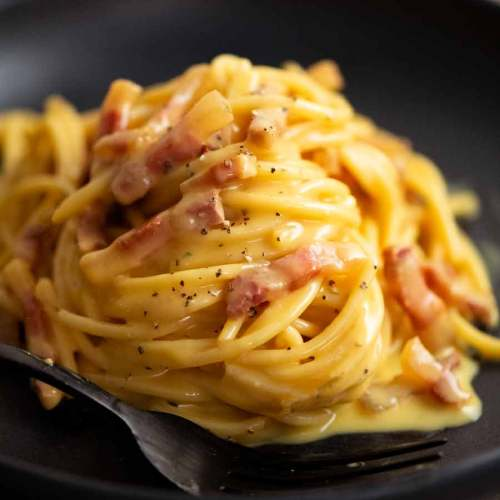

In [ ]:
path_image_target = "/content/gdrive/MyDrive/Colab Notebooks/LAVIS/search_pietanze/test_images/pasta_carbonara_test.jpg"
text_image_target = ""
number_retrieval = 5
raw_image = Image.open(path_image_target).convert("RGB")
display(raw_image)

Extracted:  1
idx:  60
similarity value:  0.75113773
name_image_found:  carbonara_2.jpg
-----------------------
Extracted:  2
idx:  64
similarity value:  0.73033893
name_image_found:  pasta_amatriciana_2.jpg
-----------------------
Extracted:  3
idx:  58
similarity value:  0.6219411
name_image_found:  pasta_pesto_2.jpg
-----------------------
Extracted:  4
idx:  57
similarity value:  0.61353487
name_image_found:  pasta_amatriciana_3.jpg
-----------------------
Extracted:  5
idx:  59
similarity value:  0.59984314
name_image_found:  carbonara_1.jpg
-----------------------


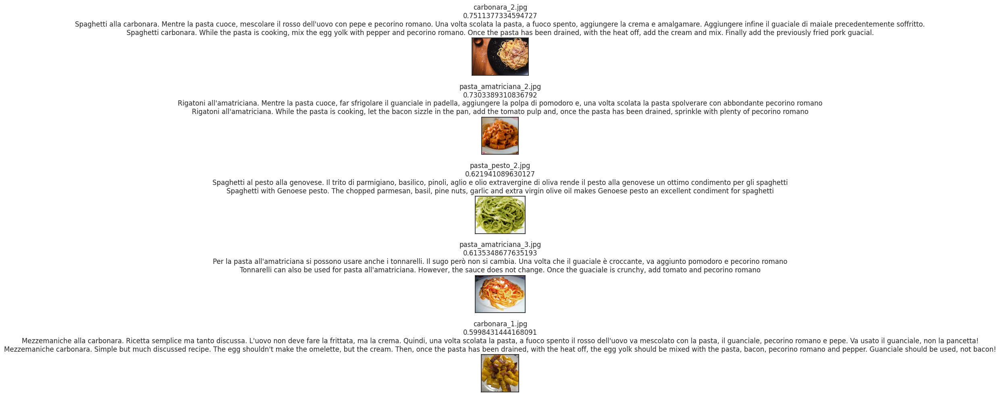

In [ ]:
retrieval_map = search_similar_product(image_target=raw_image,
                                       text_target=text_image_target,
                                       number_retrieval=number_retrieval,
                                       search_modality="II")


plt.figure(figsize=(10, 10))
for i in range(1, len(retrieval_map)+1):

    image, name_image, text, translated_text, similarity_value = retrieval_map[i]
    plt.subplot(number_retrieval, 1, i)
    plt.imshow(image)
    plt.title(f"{name_image}\n{similarity_value}\n{text}\n{translated_text}")
    plt.xticks([])
    plt.yticks([])

plt.tight_layout()

### Test 5

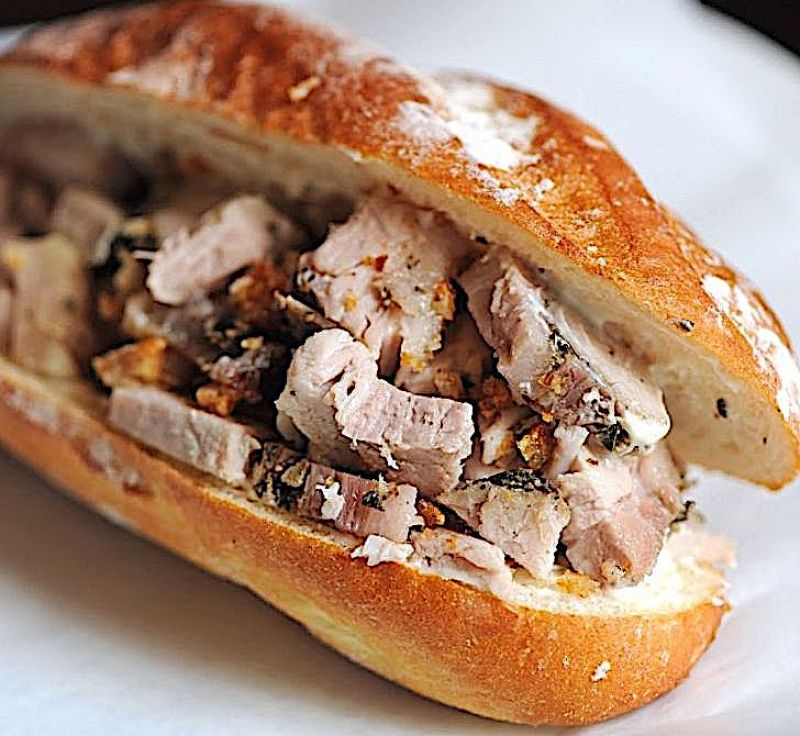

In [ ]:
path_image_target = "/content/gdrive/MyDrive/Colab Notebooks/LAVIS/search_pietanze/test_images/panino_porchetta_test.jpg"
text_image_target = ""
number_retrieval = 5
raw_image = Image.open(path_image_target).convert("RGB")
display(raw_image)

Extracted:  1
idx:  41
similarity value:  0.60912776
name_image_found:  porchetta_3.jpg
-----------------------
Extracted:  2
idx:  51
similarity value:  0.5671841
name_image_found:  porchetta_1.jpg
-----------------------
Extracted:  3
idx:  50
similarity value:  0.5382198
name_image_found:  porchetta_2.jpg
-----------------------
Extracted:  4
idx:  38
similarity value:  0.52069676
name_image_found:  vitello_tonnato_1.jpg
-----------------------
Extracted:  5
idx:  47
similarity value:  0.45536372
name_image_found:  filetto_manzo_1.jpg
-----------------------


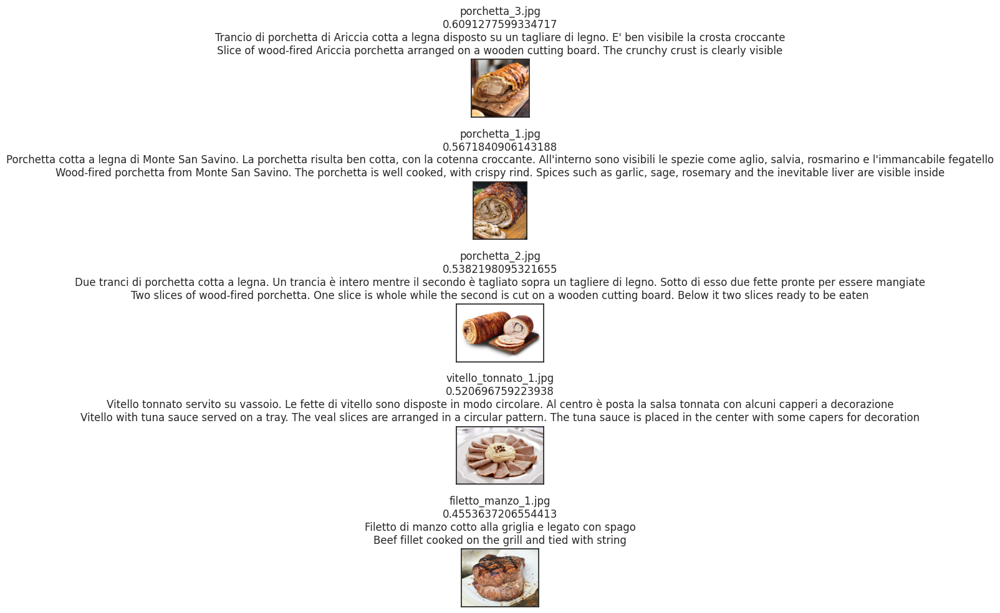

In [ ]:
retrieval_map = search_similar_product(image_target=raw_image,
                                       text_target=text_image_target,
                                       number_retrieval=number_retrieval,
                                       search_modality="II")


plt.figure(figsize=(10, 10))
for i in range(1, len(retrieval_map)+1):

    image, name_image, text, translated_text, similarity_value = retrieval_map[i]
    plt.subplot(number_retrieval, 1, i)
    plt.imshow(image)
    plt.title(f"{name_image}\n{similarity_value}\n{text}\n{translated_text}")
    plt.xticks([])
    plt.yticks([])

plt.tight_layout()

### Test 6

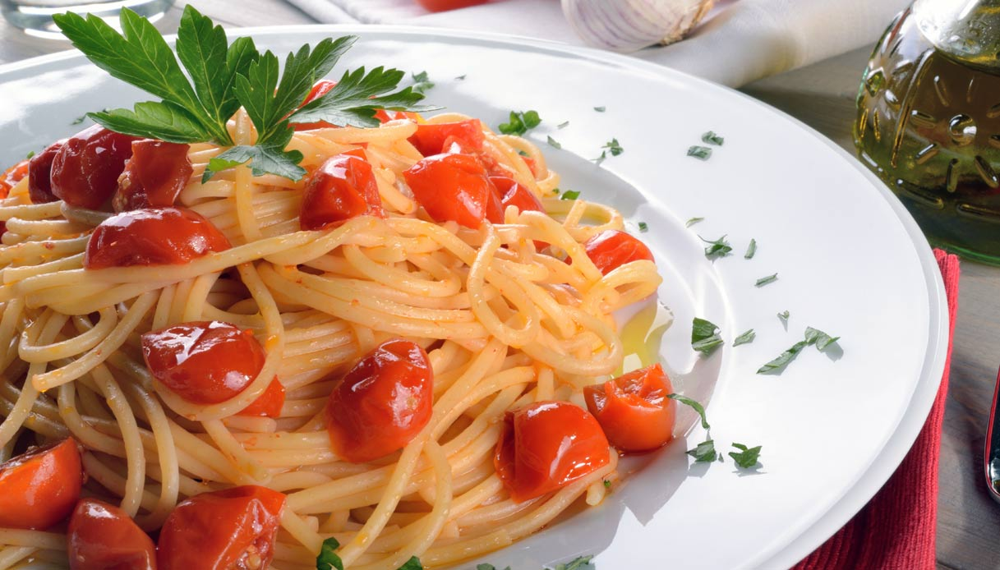

In [ ]:
path_image_target = "/content/gdrive/MyDrive/Colab Notebooks/LAVIS/search_pietanze/test_images/pasta_pomodorini_test.jpg"
text_image_target = ""
number_retrieval = 5
raw_image = Image.open(path_image_target).convert("RGB")
display(raw_image)

Extracted:  1
idx:  57
similarity value:  0.7284171
name_image_found:  pasta_amatriciana_3.jpg
-----------------------
Extracted:  2
idx:  60
similarity value:  0.6856382
name_image_found:  carbonara_2.jpg
-----------------------
Extracted:  3
idx:  66
similarity value:  0.6812467
name_image_found:  pasta_pomodoro_3.jpg
-----------------------
Extracted:  4
idx:  62
similarity value:  0.67855203
name_image_found:  pasta_pomodoro_2.jpg
-----------------------
Extracted:  5
idx:  58
similarity value:  0.67344165
name_image_found:  pasta_pesto_2.jpg
-----------------------


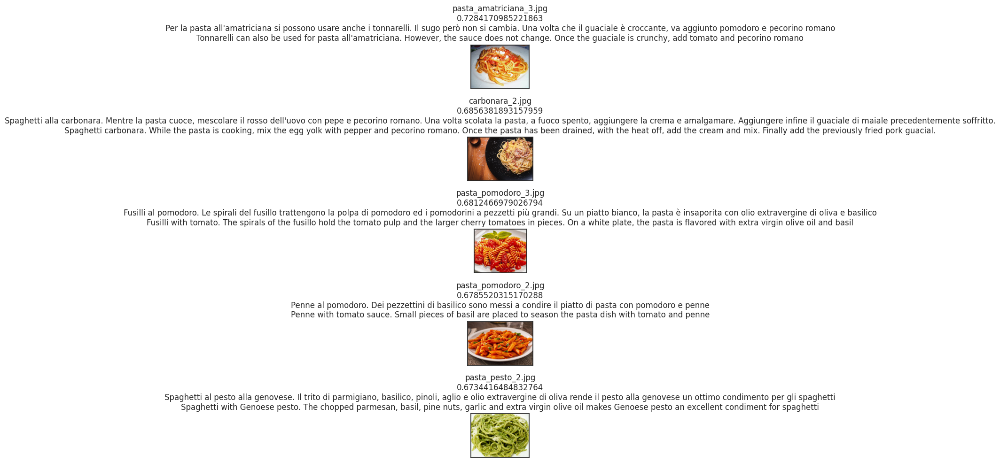

In [ ]:
retrieval_map = search_similar_product(image_target=raw_image,
                                       text_target=text_image_target,
                                       number_retrieval=number_retrieval,
                                       search_modality="II")


plt.figure(figsize=(10, 10))
for i in range(1, len(retrieval_map)+1):

    image, name_image, text, translated_text, similarity_value = retrieval_map[i]
    plt.subplot(number_retrieval, 1, i)
    plt.imshow(image)
    plt.title(f"{name_image}\n{similarity_value}\n{text}\n{translated_text}")
    plt.xticks([])
    plt.yticks([])

plt.tight_layout()

### Test 7

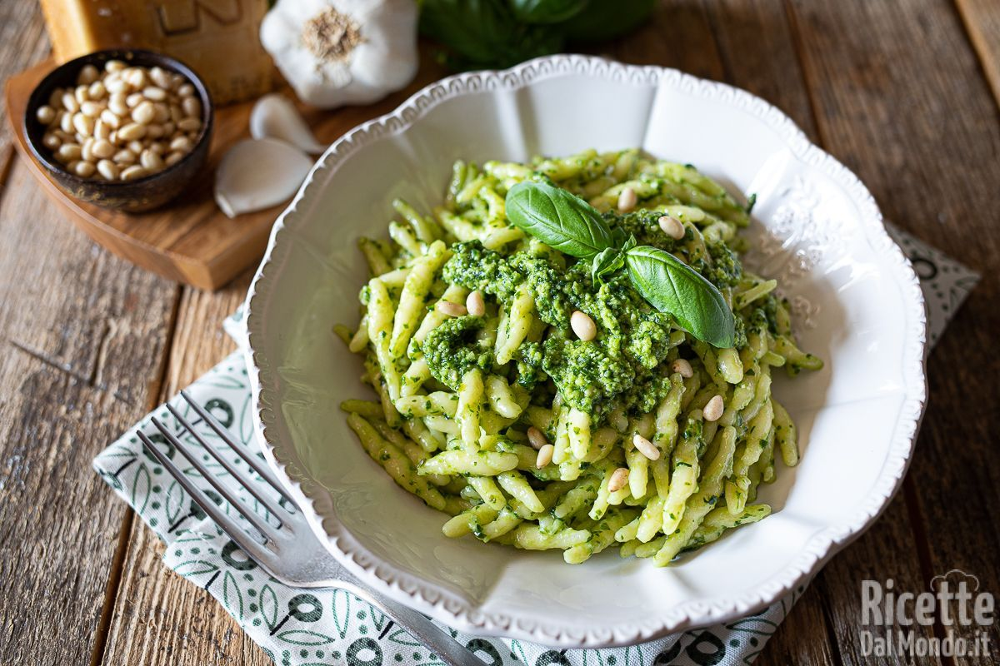

In [ ]:
path_image_target = "/content/gdrive/MyDrive/Colab Notebooks/LAVIS/search_pietanze/test_images/trofie_pesto_test.jpg"
text_image_target = ""
number_retrieval = 5
raw_image = Image.open(path_image_target).convert("RGB")
display(raw_image)

Extracted:  1
idx:  56
similarity value:  0.7693251
name_image_found:  pasta_pesto_1.jpg
-----------------------
Extracted:  2
idx:  61
similarity value:  0.7081408
name_image_found:  pasta_norma_1.jpeg
-----------------------
Extracted:  3
idx:  62
similarity value:  0.6946171
name_image_found:  pasta_pomodoro_2.jpg
-----------------------
Extracted:  4
idx:  55
similarity value:  0.6938268
name_image_found:  pasta_norma_2.jpg
-----------------------
Extracted:  5
idx:  58
similarity value:  0.67270684
name_image_found:  pasta_pesto_2.jpg
-----------------------


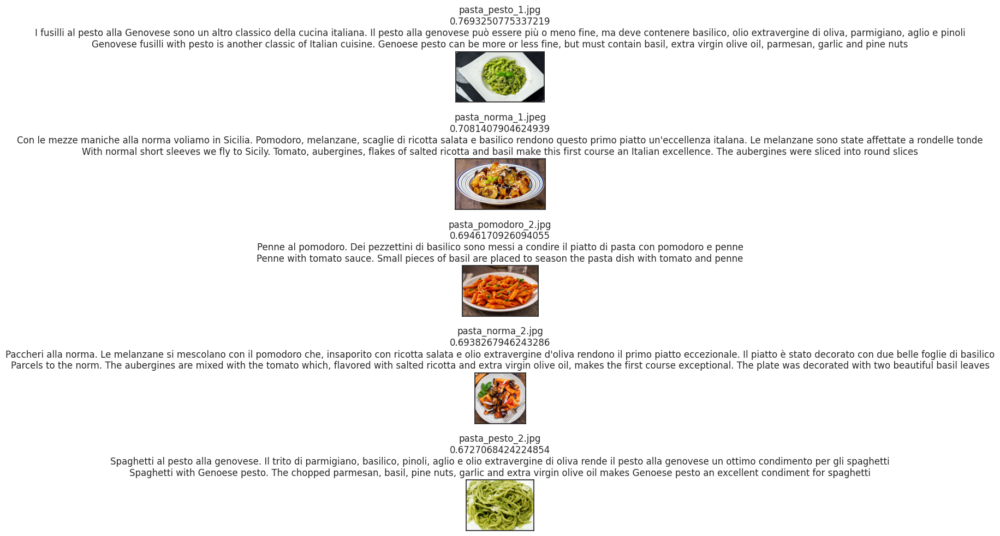

In [ ]:
retrieval_map = search_similar_product(image_target=raw_image,
                                       text_target=text_image_target,
                                       number_retrieval=number_retrieval,
                                       search_modality="II")


plt.figure(figsize=(10, 10))
for i in range(1, len(retrieval_map)+1):

    image, name_image, text, translated_text, similarity_value = retrieval_map[i]
    plt.subplot(number_retrieval, 1, i)
    plt.imshow(image)
    plt.title(f"{name_image}\n{similarity_value}\n{text}\n{translated_text}")
    plt.xticks([])
    plt.yticks([])

plt.tight_layout()

### Test 8

In [ ]:
path_image_target = "/content/gdrive/MyDrive/Colab Notebooks/LAVIS/search_pietanze/test_images/vitello_tonnato_test.jpg"
text_image_target = ""
number_retrieval = 5
raw_image = Image.open(path_image_target).convert("RGB")
display(raw_image)

Extracted:  1
idx:  38
similarity value:  0.8787768
name_image_found:  vitello_tonnato_1.jpg
-----------------------
Extracted:  2
idx:  40
similarity value:  0.8519938
name_image_found:  vitello_tonnato_3.jpg
-----------------------
Extracted:  3
idx:  35
similarity value:  0.72033674
name_image_found:  petto_pollo_pizzaiola_2.jpg
-----------------------
Extracted:  4
idx:  49
similarity value:  0.686844
name_image_found:  filetto_pepe_verde_2.png
-----------------------
Extracted:  5
idx:  46
similarity value:  0.67134005
name_image_found:  vitello_tonnato_2.jpg
-----------------------


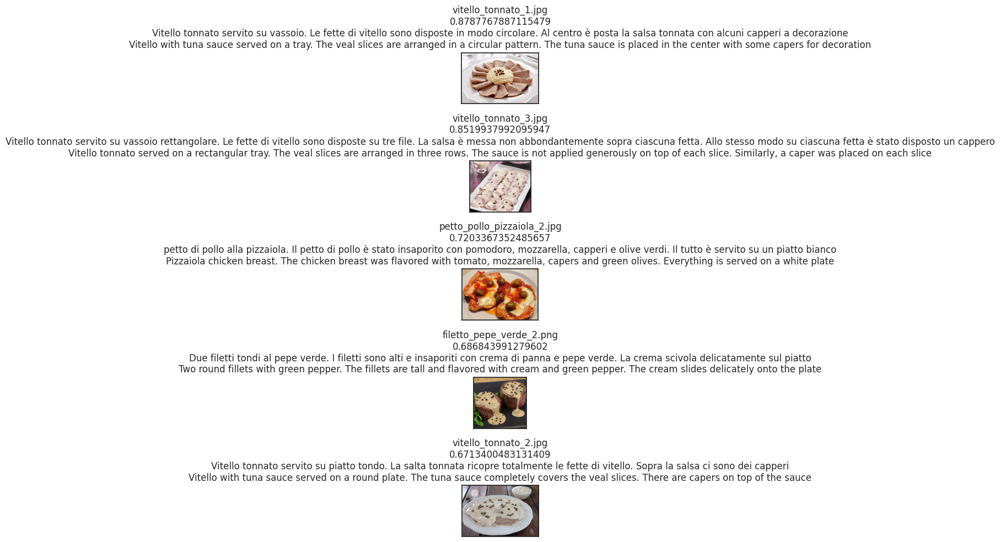

In [ ]:
retrieval_map = search_similar_product(image_target=raw_image,
                                       text_target=text_image_target,
                                       number_retrieval=number_retrieval,
                                       search_modality="II")


plt.figure(figsize=(10, 10))
for i in range(1, len(retrieval_map)+1):

    image, name_image, text, translated_text, similarity_value = retrieval_map[i]
    plt.subplot(number_retrieval, 1, i)
    plt.imshow(image)
    plt.title(f"{name_image}\n{similarity_value}\n{text}\n{translated_text}")
    plt.xticks([])
    plt.yticks([])

plt.tight_layout()

### Test 9

In [ ]:
text_image_target = "Pizza quattro stagioni con olive, funghi e prosciutto cotto"
number_retrieval = 5

Extracted:  1
idx:  34
similarity value:  0.25257033
name_image_found:  pizza_quattro_stagioni_3.jpg
-----------------------
Extracted:  2
idx:  28
similarity value:  0.24769764
name_image_found:  pizza_quattro_stagioni.jpg
-----------------------
Extracted:  3
idx:  20
similarity value:  0.23887913
name_image_found:  pizza_capricciosa_2.jpg
-----------------------
Extracted:  4
idx:  24
similarity value:  0.21685147
name_image_found:  pizza_napoli_2.jpg
-----------------------
Extracted:  5
idx:  22
similarity value:  0.20011374
name_image_found:  pizza_capricciosa_1.jpg
-----------------------


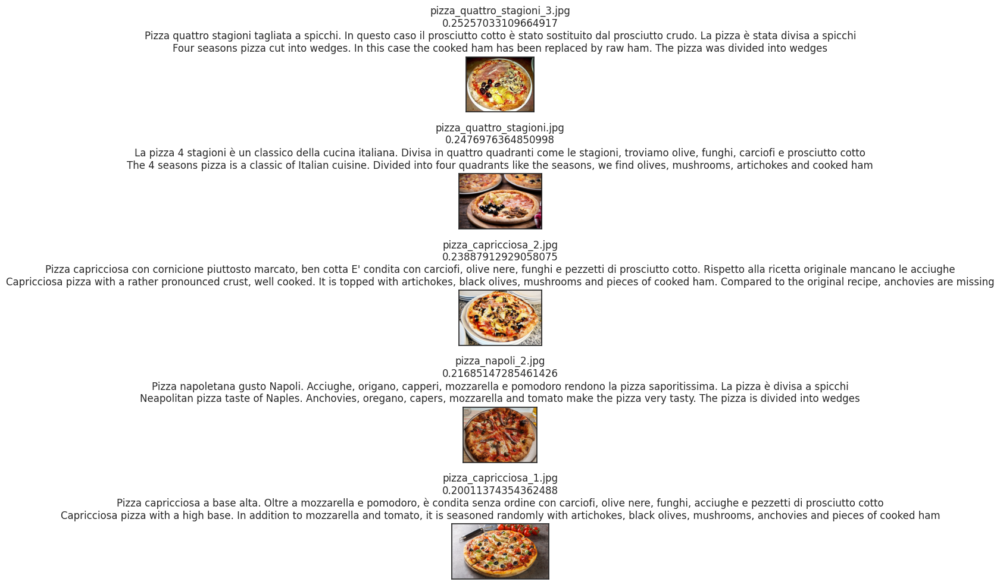

In [ ]:
retrieval_map = search_similar_product(image_target=raw_image,
                                       text_target=text_image_target,
                                       number_retrieval=number_retrieval,
                                       search_modality="TI")


plt.figure(figsize=(10, 10))
for i in range(1, len(retrieval_map)+1):

    image, name_image, text, translated_text, similarity_value = retrieval_map[i]
    plt.subplot(number_retrieval, 1, i)
    plt.imshow(image)
    plt.title(f"{name_image}\n{similarity_value}\n{text}\n{translated_text}")
    plt.xticks([])
    plt.yticks([])

plt.tight_layout()

Extracted:  1
idx:  27
similarity value:  0.6307504
name_image_found:  pizza_quattro_formaggi_1.jpg
-----------------------
Extracted:  2
idx:  38
similarity value:  0.60389096
name_image_found:  vitello_tonnato_1.jpg
-----------------------
Extracted:  3
idx:  60
similarity value:  0.59615374
name_image_found:  carbonara_2.jpg
-----------------------
Extracted:  4
idx:  23
similarity value:  0.58883524
name_image_found:  calzone_2.jpg
-----------------------
Extracted:  5
idx:  39
similarity value:  0.55951583
name_image_found:  pollo_arrosto_1.jpg
-----------------------


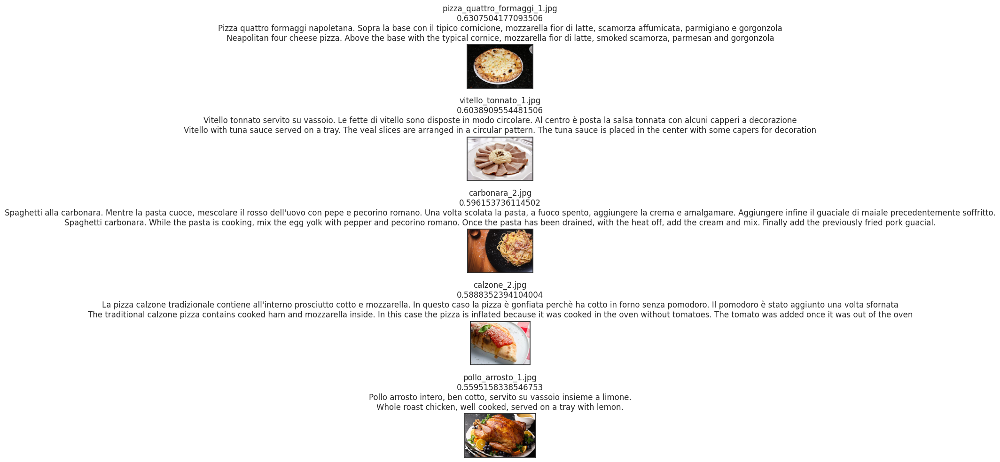

In [ ]:
retrieval_map = search_similar_product(image_target=raw_image,
                                       text_target=text_image_target,
                                       number_retrieval=number_retrieval,
                                       search_modality="MM")


plt.figure(figsize=(10, 10))
for i in range(1, len(retrieval_map)+1):

    image, name_image, text, translated_text, similarity_value = retrieval_map[i]
    plt.subplot(number_retrieval, 1, i)
    plt.imshow(image)
    plt.title(f"{name_image}\n{similarity_value}\n{text}\n{translated_text}")
    plt.xticks([])
    plt.yticks([])

plt.tight_layout()

Extracted:  1
idx:  32
similarity value:  0.9593401
name_image_found:  pizza_quattro_stagioni_2.jpg
-----------------------
Extracted:  2
idx:  22
similarity value:  0.9151442
name_image_found:  pizza_capricciosa_1.jpg
-----------------------
Extracted:  3
idx:  28
similarity value:  0.9065815
name_image_found:  pizza_quattro_stagioni.jpg
-----------------------
Extracted:  4
idx:  20
similarity value:  0.9054545
name_image_found:  pizza_capricciosa_2.jpg
-----------------------
Extracted:  5
idx:  35
similarity value:  0.86897206
name_image_found:  petto_pollo_pizzaiola_2.jpg
-----------------------


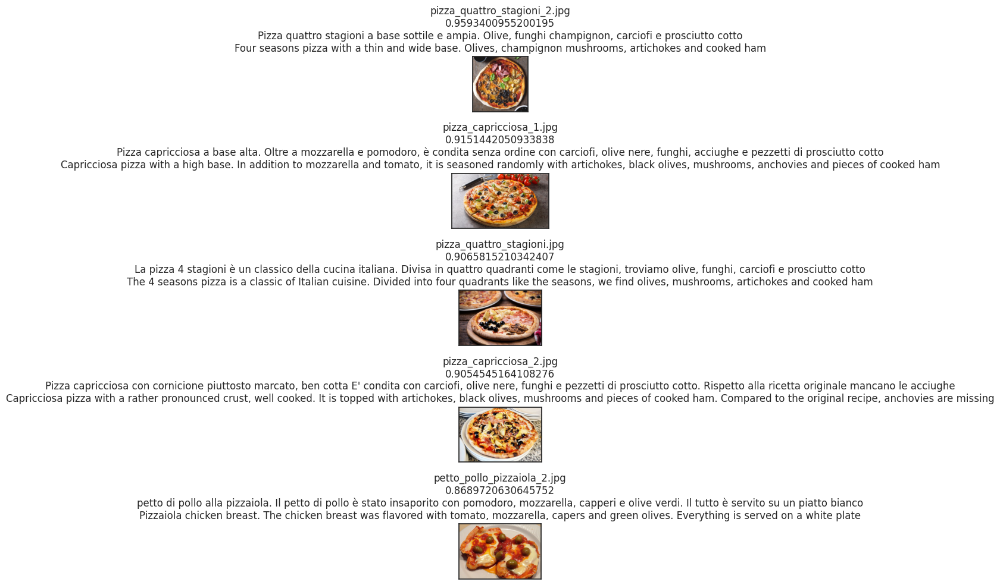

In [ ]:
retrieval_map = search_similar_product(image_target=raw_image,
                                       text_target=text_image_target,
                                       number_retrieval=number_retrieval,
                                       search_modality="TT")

plt.figure(figsize=(10, 10))
for i in range(1, len(retrieval_map)+1):

    image, name_image, text, translated_text, similarity_value = retrieval_map[i]
    plt.subplot(number_retrieval, 1, i)
    plt.imshow(image)
    plt.title(f"{name_image}\n{similarity_value}\n{text}\n{translated_text}")
    plt.xticks([])
    plt.yticks([])

plt.tight_layout()

### Test 10

In [ ]:
text_image_target = "PAppardelle al sugo di cinghiale senza pomodoro"
number_retrieval = 5

Extracted:  1
idx:  31
similarity value:  0.21304491
name_image_found:  pizza_napoli.jpg
-----------------------
Extracted:  2
idx:  55
similarity value:  0.20690703
name_image_found:  pasta_norma_2.jpg
-----------------------
Extracted:  3
idx:  66
similarity value:  0.20128743
name_image_found:  pasta_pomodoro_3.jpg
-----------------------
Extracted:  4
idx:  25
similarity value:  0.19772756
name_image_found:  pizza_quattro_formaggi_2.jpg
-----------------------
Extracted:  5
idx:  64
similarity value:  0.19764411
name_image_found:  pasta_amatriciana_2.jpg
-----------------------


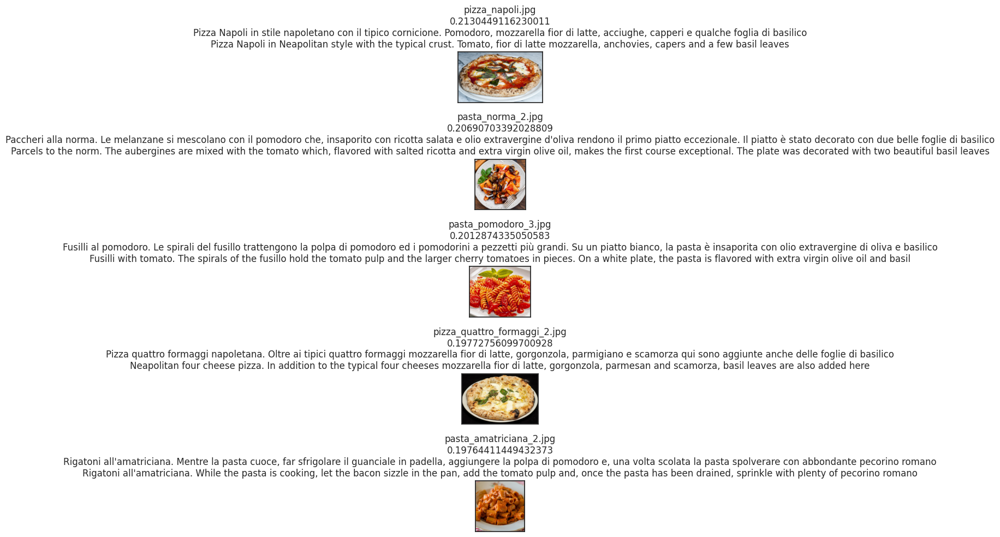

In [ ]:
retrieval_map = search_similar_product(image_target=raw_image,
                                       text_target=text_image_target,
                                       number_retrieval=number_retrieval,
                                       search_modality="TI")


plt.figure(figsize=(10, 10))
for i in range(1, len(retrieval_map)+1):

    image, name_image, text, translated_text, similarity_value = retrieval_map[i]
    plt.subplot(number_retrieval, 1, i)
    plt.imshow(image)
    plt.title(f"{name_image}\n{similarity_value}\n{text}\n{translated_text}")
    plt.xticks([])
    plt.yticks([])

plt.tight_layout()

Extracted:  1
idx:  38
similarity value:  0.7779136
name_image_found:  vitello_tonnato_1.jpg
-----------------------
Extracted:  2
idx:  34
similarity value:  0.7723649
name_image_found:  pizza_quattro_stagioni_3.jpg
-----------------------
Extracted:  3
idx:  26
similarity value:  0.75910234
name_image_found:  pizza_margherita_3.jpg
-----------------------
Extracted:  4
idx:  57
similarity value:  0.7418621
name_image_found:  pasta_amatriciana_3.jpg
-----------------------
Extracted:  5
idx:  27
similarity value:  0.73837197
name_image_found:  pizza_quattro_formaggi_1.jpg
-----------------------


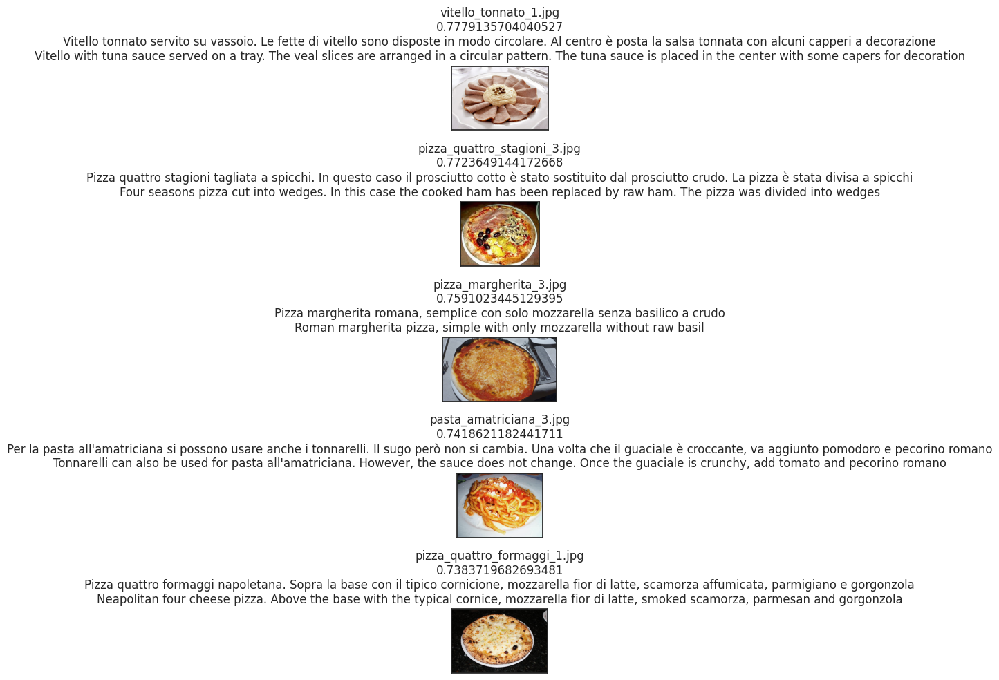

In [ ]:
retrieval_map = search_similar_product(image_target=raw_image,
                                       text_target=text_image_target,
                                       number_retrieval=number_retrieval,
                                       search_modality="MM")


plt.figure(figsize=(10, 10))
for i in range(1, len(retrieval_map)+1):

    image, name_image, text, translated_text, similarity_value = retrieval_map[i]
    plt.subplot(number_retrieval, 1, i)
    plt.imshow(image)
    plt.title(f"{name_image}\n{similarity_value}\n{text}\n{translated_text}")
    plt.xticks([])
    plt.yticks([])

plt.tight_layout()

Extracted:  1
idx:  65
similarity value:  0.8927745
name_image_found:  pappardelle_cinghiale.jpeg
-----------------------
Extracted:  2
idx:  63
similarity value:  0.88916665
name_image_found:  pappardelle_cinghiale_2.jpg
-----------------------
Extracted:  3
idx:  54
similarity value:  0.84022194
name_image_found:  pasta_amatriciana_1.jpg
-----------------------
Extracted:  4
idx:  46
similarity value:  0.83997625
name_image_found:  vitello_tonnato_2.jpg
-----------------------
Extracted:  5
idx:  57
similarity value:  0.8264561
name_image_found:  pasta_amatriciana_3.jpg
-----------------------


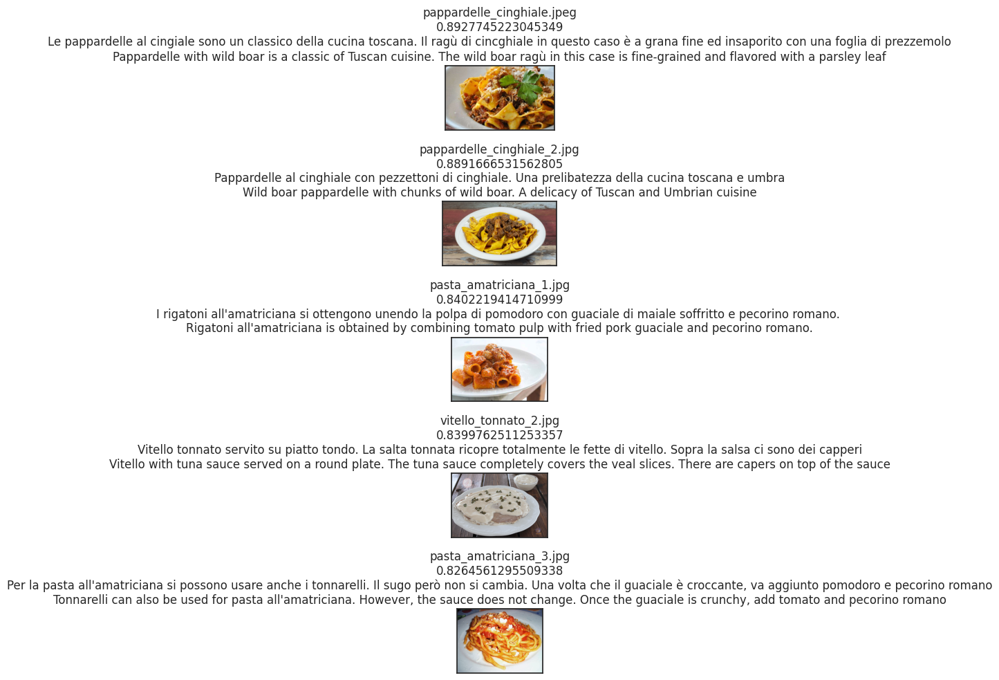

In [ ]:
retrieval_map = search_similar_product(image_target=raw_image,
                                       text_target=text_image_target,
                                       number_retrieval=number_retrieval,
                                       search_modality="TT")


plt.figure(figsize=(10, 10))
for i in range(1, len(retrieval_map)+1):

    image, name_image, text, translated_text, similarity_value = retrieval_map[i]
    plt.subplot(number_retrieval, 1, i)
    plt.imshow(image)
    plt.title(f"{name_image}\n{similarity_value}\n{text}\n{translated_text}")
    plt.xticks([])
    plt.yticks([])

plt.tight_layout()

### Test 11

In [ ]:
text_image_target = "Crostata con fragole, crema e gocce di cioccolato e zucchero a velo"
number_retrieval = 5

Extracted:  1
idx:  8
similarity value:  0.24785075
name_image_found:  crostata_3.jpg
-----------------------
Extracted:  2
idx:  13
similarity value:  0.24695605
name_image_found:  crostata_1.jpg
-----------------------
Extracted:  3
idx:  12
similarity value:  0.19696724
name_image_found:  millefoglie_2.jpg
-----------------------
Extracted:  4
idx:  10
similarity value:  0.18714817
name_image_found:  millefoglie_3.jpg
-----------------------
Extracted:  5
idx:  3
similarity value:  0.17900261
name_image_found:  crostata_2.jpg
-----------------------


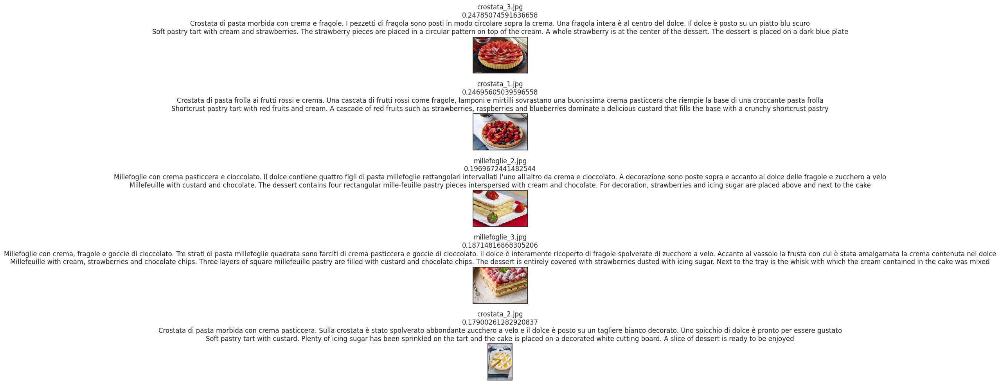

In [ ]:
retrieval_map = search_similar_product(image_target=raw_image,
                                       text_target=text_image_target,
                                       number_retrieval=number_retrieval,
                                       search_modality="TI")


plt.figure(figsize=(10, 10))
for i in range(1, len(retrieval_map)+1):

    image, name_image, text, translated_text, similarity_value = retrieval_map[i]
    plt.subplot(number_retrieval, 1, i)
    plt.imshow(image)
    plt.title(f"{name_image}\n{similarity_value}\n{text}\n{translated_text}")
    plt.xticks([])
    plt.yticks([])

plt.tight_layout()

Extracted:  1
idx:  60
similarity value:  0.5721232
name_image_found:  carbonara_2.jpg
-----------------------
Extracted:  2
idx:  23
similarity value:  0.5279265
name_image_found:  calzone_2.jpg
-----------------------
Extracted:  3
idx:  61
similarity value:  0.5086667
name_image_found:  pasta_norma_1.jpeg
-----------------------
Extracted:  4
idx:  39
similarity value:  0.46916527
name_image_found:  pollo_arrosto_1.jpg
-----------------------
Extracted:  5
idx:  67
similarity value:  0.36165988
name_image_found:  carbonara_3.jpeg
-----------------------


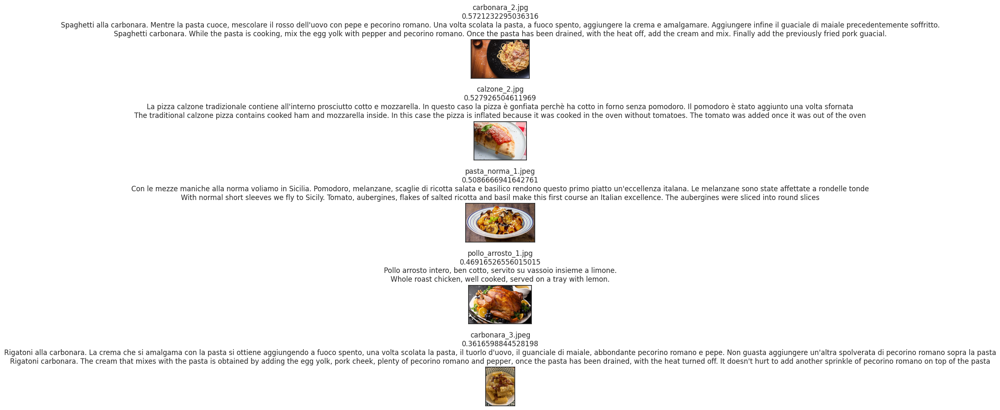

In [ ]:
retrieval_map = search_similar_product(image_target=raw_image,
                                       text_target=text_image_target,
                                       number_retrieval=number_retrieval,
                                       search_modality="MM")


plt.figure(figsize=(10, 10))
for i in range(1, len(retrieval_map)+1):

    image, name_image, text, translated_text, similarity_value = retrieval_map[i]
    plt.subplot(number_retrieval, 1, i)
    plt.imshow(image)
    plt.title(f"{name_image}\n{similarity_value}\n{text}\n{translated_text}")
    plt.xticks([])
    plt.yticks([])

plt.tight_layout()

Extracted:  1
idx:  13
similarity value:  0.9242197
name_image_found:  crostata_1.jpg
-----------------------
Extracted:  2
idx:  8
similarity value:  0.9189473
name_image_found:  crostata_3.jpg
-----------------------
Extracted:  3
idx:  10
similarity value:  0.90827227
name_image_found:  millefoglie_3.jpg
-----------------------
Extracted:  4
idx:  0
similarity value:  0.9047803
name_image_found:  panna_cotta_1.jpeg
-----------------------
Extracted:  5
idx:  12
similarity value:  0.89759564
name_image_found:  millefoglie_2.jpg
-----------------------


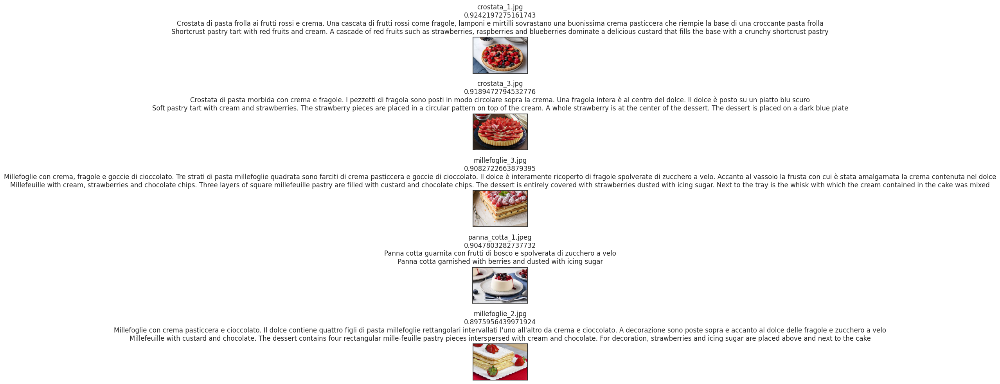

In [ ]:
retrieval_map = search_similar_product(image_target=raw_image,
                                       text_target=text_image_target,
                                       number_retrieval=number_retrieval,
                                       search_modality="TT")


plt.figure(figsize=(10, 10))
for i in range(1, len(retrieval_map)+1):

    image, name_image, text, translated_text, similarity_value = retrieval_map[i]
    plt.subplot(number_retrieval, 1, i)
    plt.imshow(image)
    plt.title(f"{name_image}\n{similarity_value}\n{text}\n{translated_text}")
    plt.xticks([])
    plt.yticks([])

plt.tight_layout()

### Test 12

In [ ]:
text_image_target = "Pasta all'amatriciana con pomodori, guanciale, spaghetti e spolverata di pecorino romano"
number_retrieval = 5

Extracted:  1
idx:  66
similarity value:  0.24581563
name_image_found:  pasta_pomodoro_3.jpg
-----------------------
Extracted:  2
idx:  62
similarity value:  0.20282309
name_image_found:  pasta_pomodoro_2.jpg
-----------------------
Extracted:  3
idx:  65
similarity value:  0.20280552
name_image_found:  pappardelle_cinghiale.jpeg
-----------------------
Extracted:  4
idx:  61
similarity value:  0.18836458
name_image_found:  pasta_norma_1.jpeg
-----------------------
Extracted:  5
idx:  57
similarity value:  0.18490392
name_image_found:  pasta_amatriciana_3.jpg
-----------------------


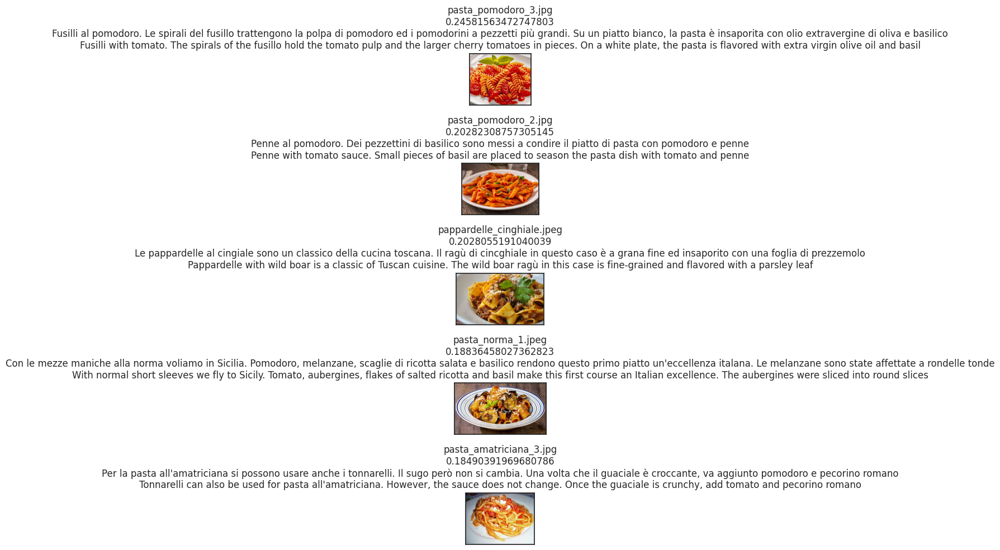

In [ ]:
retrieval_map = search_similar_product(image_target=raw_image,
                                       text_target=text_image_target,
                                       number_retrieval=number_retrieval,
                                       search_modality="TI")


plt.figure(figsize=(10, 10))
for i in range(1, len(retrieval_map)+1):

    image, name_image, text, translated_text, similarity_value = retrieval_map[i]
    plt.subplot(number_retrieval, 1, i)
    plt.imshow(image)
    plt.title(f"{name_image}\n{similarity_value}\n{text}\n{translated_text}")
    plt.xticks([])
    plt.yticks([])

plt.tight_layout()

Extracted:  1
idx:  60
similarity value:  0.5998933
name_image_found:  carbonara_2.jpg
-----------------------
Extracted:  2
idx:  23
similarity value:  0.5348867
name_image_found:  calzone_2.jpg
-----------------------
Extracted:  3
idx:  61
similarity value:  0.52474785
name_image_found:  pasta_norma_1.jpeg
-----------------------
Extracted:  4
idx:  39
similarity value:  0.45799482
name_image_found:  pollo_arrosto_1.jpg
-----------------------
Extracted:  5
idx:  67
similarity value:  0.39478326
name_image_found:  carbonara_3.jpeg
-----------------------


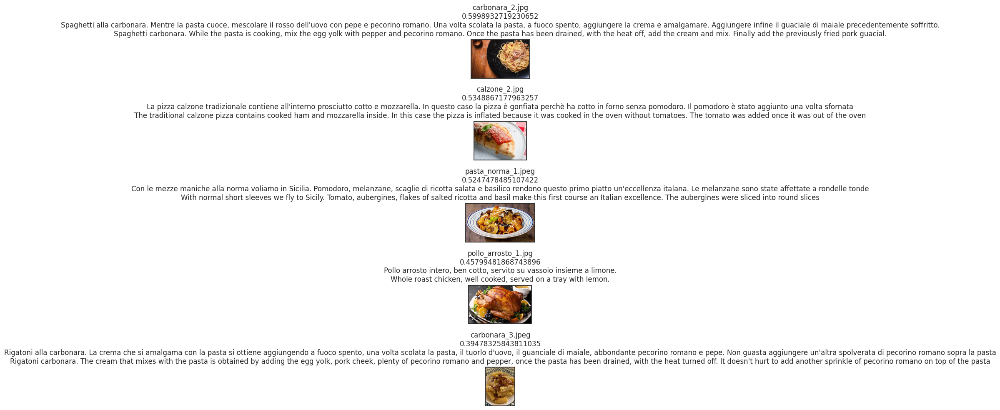

In [ ]:
retrieval_map = search_similar_product(image_target=raw_image,
                                       text_target=text_image_target,
                                       number_retrieval=number_retrieval,
                                       search_modality="MM")


plt.figure(figsize=(10, 10))
for i in range(1, len(retrieval_map)+1):

    image, name_image, text, translated_text, similarity_value = retrieval_map[i]
    plt.subplot(number_retrieval, 1, i)
    plt.imshow(image)
    plt.title(f"{name_image}\n{similarity_value}\n{text}\n{translated_text}")
    plt.xticks([])
    plt.yticks([])

plt.tight_layout()

Extracted:  1
idx:  64
similarity value:  0.91409445
name_image_found:  pasta_amatriciana_2.jpg
-----------------------
Extracted:  2
idx:  29
similarity value:  0.88821524
name_image_found:  pizza_marinara_1.jpg
-----------------------
Extracted:  3
idx:  54
similarity value:  0.8806123
name_image_found:  pasta_amatriciana_1.jpg
-----------------------
Extracted:  4
idx:  62
similarity value:  0.8782525
name_image_found:  pasta_pomodoro_2.jpg
-----------------------
Extracted:  5
idx:  22
similarity value:  0.868729
name_image_found:  pizza_capricciosa_1.jpg
-----------------------


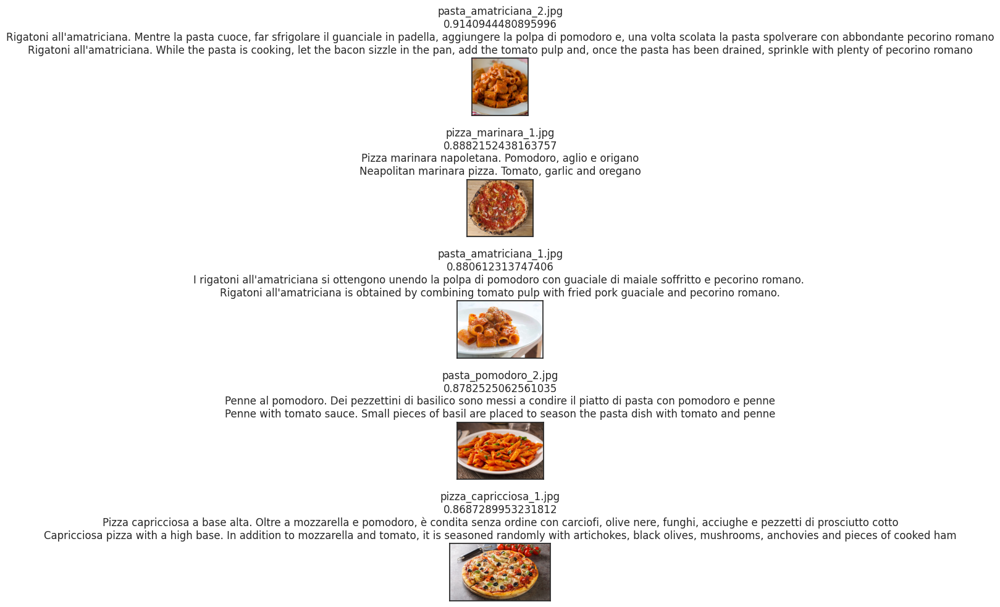

In [ ]:
retrieval_map = search_similar_product(image_target=raw_image,
                                       text_target=text_image_target,
                                       number_retrieval=number_retrieval,
                                       search_modality="TT")


plt.figure(figsize=(10, 10))
for i in range(1, len(retrieval_map)+1):

    image, name_image, text, translated_text, similarity_value = retrieval_map[i]
    plt.subplot(number_retrieval, 1, i)
    plt.imshow(image)
    plt.title(f"{name_image}\n{similarity_value}\n{text}\n{translated_text}")
    plt.xticks([])
    plt.yticks([])

plt.tight_layout()